## 🐶 Dog Face Detection using YOLOv8

Welcome to this project notebook on **Dog Face Detection** using **YOLOv8**

### 📌 Project Overview
In this notebook, we aim to develop a deep learning model capable of accurately detecting **dog faces** in images and videos. Leveraging the capabilities of **YOLOv8**, which is known for its speed and accuracy, we fine-tune the model on a dataset of dog faces to enable precise and real-time detection.

### 🔍 Objectives
- Load and preprocess a dataset containing dog face annotations.
- Train a YOLOv8 object detection model.
- Evaluate the performance of the model.
- Test the model on new images and videos to visualize detection results.

### 🐾 Why Dog Face Detection?
While human face detection is widely used, detecting dog faces can be useful in:
- Pet monitoring systems
- Veterinary health applications
- Animal behavior analysis
- Fun filters and AR apps for pets

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 994.1/994.1 kB 9.9 MB/s eta 0:00:00:00:01


In [2]:
import pandas as pd
import numpy as np
from ultralytics import YOLO
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from tqdm import tqdm
import os
import shutil
from shutil import copyfile
import cv2
import yaml
import random
from PIL import Image


rc('animation', html='jshtml')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
label_dir = '/kaggle/input/dog-face-detectionyolo-format/train_label'
image_dir = '/kaggle/input/dog-face-detectionyolo-format/train_img'
train_output = 'datasets/train'
test_output = 'datasets/test'

### 🖼️ Displaying Sample Images from the Dataset

This code snippet loads and displays the **first 6 images** from the dataset directory to give a quick visual overview. It filters files by common image extensions, sorts them alphabetically, and arranges them in a **2x3 grid** using Matplotlib for easy viewing and verification.


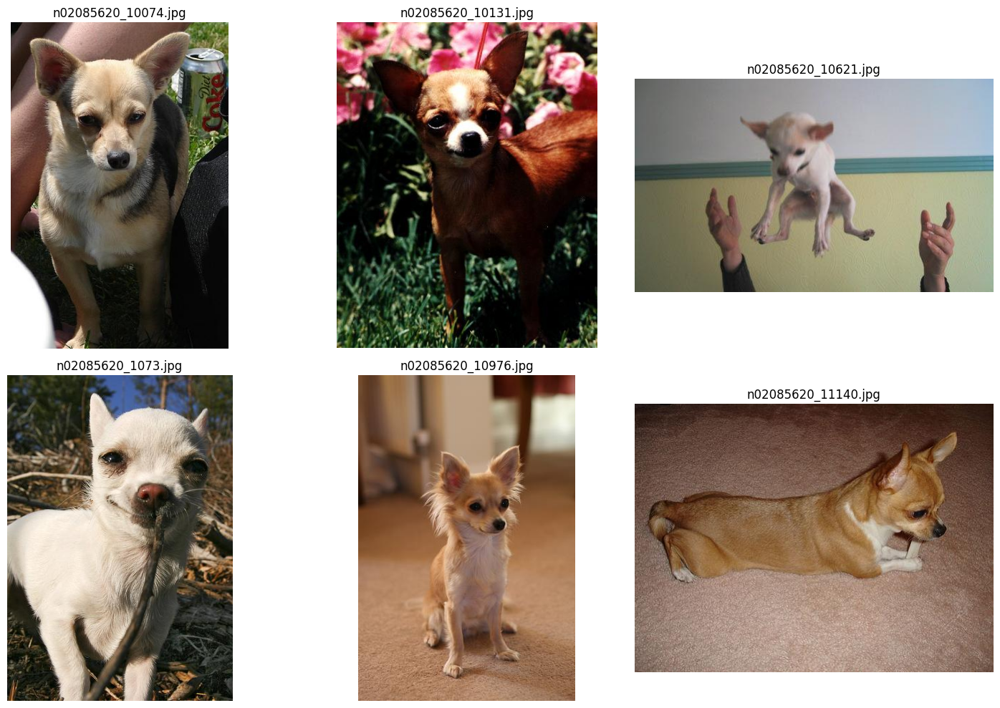

In [4]:
image_extensions = ('.jpg', '.jpeg', '.png', '.bmp')
image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(image_extensions)]

# Sort and pick top 6
top_images = sorted(image_files)[:6]

# Set up the grid
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

# Display each image
for i, img_file in enumerate(top_images):
    img_path = os.path.join(image_dir, img_file)
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(img_file)
    axes[i].axis('off')

# Hide any unused axes
for j in range(len(top_images), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [5]:
!mkdir datasets
!mkdir datasets/train
!mkdir datasets/valid
!mkdir datasets/test

### 📁 Sampling and Splitting Dataset

This section **randomly samples 200 images** from the dataset and splits them into a **75% training** and **25% testing** set. For each image, the corresponding label file (in `.txt` format) is also copied to the appropriate output directory (`train_output` or `test_output`), ensuring images and annotations stay paired.


In [6]:
# Collect all image paths
image_paths = [
    os.path.join(root, file)
    for root, _, files in os.walk(image_dir)
    for file in files
]

# Sample 200 images
sampled_paths = random.sample(image_paths, 200)

# Split and copy images and labels
split_index = len(sampled_paths) * 3 // 4
for i, img_path in enumerate(sampled_paths):
    label_filename = os.path.splitext(os.path.basename(img_path))[0] + '.txt'
    label_path = os.path.join(label_dir, label_filename)

    if i < split_index:
        shutil.copy(img_path, train_output)
        shutil.copy(label_path, train_output)
    else:
        shutil.copy(img_path, test_output)
        shutil.copy(label_path, test_output)


In [7]:
# Validation directories
val_label_dir = '/kaggle/input/dog-face-detectionyolo-format/val_label'
val_image_dir = '/kaggle/input/dog-face-detectionyolo-format/val_img'
valid_output = 'datasets/valid'

# Collect all validation image paths
val_image_paths = [
    os.path.join(root, file)
    for root, _, files in os.walk(val_image_dir)
    for file in files
]

# Randomly sample 50 images
sampled_val_paths = random.sample(val_image_paths, 50)

# Copy images and corresponding label files
for img_path in sampled_val_paths:
    label_filename = os.path.splitext(os.path.basename(img_path))[0] + '.txt'
    label_path = os.path.join(val_label_dir, label_filename)

    shutil.copy(img_path, valid_output)
    shutil.copy(label_path, valid_output)

In [8]:
train_path='/kaggle/working/datasets/train'
valid_path='/kaggle/working/datasets/valid'
test_path='/kaggle/working/datasets/test'

In [9]:
import yaml

data_yaml = dict(
    train =train_path,
    val =valid_path,
    test=test_path,
    nc =1,
    names =['dog_face']
)

with open('data.yaml', 'w') as outfile:
    yaml.dump(data_yaml, outfile, default_flow_style=True)
    
%cat data.yaml

{names: [dog_face], nc: 1, test: /kaggle/working/datasets/test, train: /kaggle/working/datasets/train,
  val: /kaggle/working/datasets/valid}


In [10]:
yolo_path = "/kaggle/input/yolov8_default/other/2/2/yolov8x.pt"
model = YOLO(yolo_path)

In [11]:
model.train(
    data='/kaggle/working/data.yaml',     # path to dataset YAML
    epochs=100,
    imgsz=480,
    device=0,             # use CUDA device 0 (GPU); use 'cpu' to disable
    mode='train'          # optional, 'train' is the default
)

Ultralytics 8.3.104 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=/kaggle/input/yolov8_default/other/2/2/yolov8x.pt, data=/kaggle/working/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=480, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=Fa

100%|██████████| 755k/755k [00:00<00:00, 26.5MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      2320  ultralytics.nn.modules.conv.Conv             [3, 80, 3, 2]                 
  1                  -1  1    115520  ultralytics.nn.modules.conv.Conv             [80, 160, 3, 2]               
  2                  -1  3    436800  ultralytics.nn.modules.block.C2f             [160, 160, 3, True]           
  3                  -1  1    461440  ultralytics.nn.modules.conv.Conv             [160, 320, 3, 2]              
  4                  -1  6   3281920  ultralytics.nn.modules.block.C2f             [320, 320, 6, True]           
  5                  -1  1   1844480  ultralytics.nn.modules.conv.Conv             [320, 640, 3, 2]              
  6                  -1  6  13117440  ultralytics.nn.modules.block.C2f             [640, 640, 6, True]           
  7                  -1  1   3687680  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 110MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/datasets/train... 150 images, 0 backgrounds, 0 corrupt: 100%|██████████| 150/150 [00:00<00:00, 1112.37it/s]

train: New cache created: /kaggle/working/datasets/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/working/datasets/valid... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<00:00, 978.85it/s]

val: New cache created: /kaggle/working/datasets/valid.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 480 train, 480 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      8.21G      1.507       4.33      1.851         11        480: 100%|██████████| 10/10 [00:08<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.00it/s]

                   all         50         53      0.293     0.0755     0.0426     0.0204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      10.7G      1.493      3.008      1.775         14        480: 100%|██████████| 10/10 [00:07<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53    0.00536      0.264    0.00344    0.00153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      10.7G      1.715      2.335      1.903         17        480: 100%|██████████| 10/10 [00:07<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/engine/validator.py:289: RuntimeWarning: invalid value encountered in greater_equal
  matches = np.nonzero(iou >= threshold)  # IoU > threshold and classes match
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.002      0.226    0.00125   0.000347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      10.7G      1.675      2.206      1.928         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/engine/validator.py:289: RuntimeWarning: invalid value encountered in greater_equal
  matches = np.nonzero(iou >= threshold)  # IoU > threshold and classes match
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]

                   all         50         53   0.000106     0.0189    5.4e-05   1.08e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      10.7G       1.92      2.295      2.075         21        480: 100%|██████████| 10/10 [00:07<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]

                   all         50         53          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      10.7G      1.884      2.226      2.022         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.51it/s]

                   all         50         53          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      10.7G      1.883      2.203       2.03         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.50it/s]

                   all         50         53          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      10.7G      1.957      2.134      2.058         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         50         53          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      10.7G      1.958      2.203      2.071         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/engine/validator.py:289: RuntimeWarning: invalid value encountered in greater_equal
  matches = np.nonzero(iou >= threshold)  # IoU > threshold and classes match
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         50         53          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      10.7G      1.875      2.071      1.995         20        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/engine/validator.py:289: RuntimeWarning: invalid value encountered in greater_equal
  matches = np.nonzero(iou >= threshold)  # IoU > threshold and classes match
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         50         53          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      10.7G      2.022      2.257      2.153         17        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         50         53          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      10.7G      1.965      2.267      2.163         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.42it/s]

                   all         50         53          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      10.7G      1.947      2.134      2.083         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         53          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      10.7G      1.866      2.007      2.107         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         50         53          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      10.7G      2.007      2.183      2.142         19        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         50         53     0.0964       0.17     0.0751     0.0181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      10.7G      1.853      2.028      2.128         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         50         53     0.0643     0.0566    0.00701    0.00245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      10.7G      1.892      2.071      2.105         17        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         50         53     0.0329     0.0377    0.00858    0.00381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      10.7G      1.809      1.929      2.002         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         50         53    0.00038     0.0566   0.000201   3.31e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      10.7G      1.838       1.89      2.039          7        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         50         53          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      10.7G      1.763      1.813      2.031         10        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.189      0.113      0.075     0.0229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      10.7G      1.735      1.826      1.954         18        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.454      0.264      0.293      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      10.7G      1.807      1.724      1.991         16        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         50         53    0.00104     0.0943   0.000603   0.000105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      10.7G      1.732      1.792      1.992         14        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.109     0.0943      0.028     0.0129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      10.7G      1.692      1.665      1.959         15        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.268       0.34      0.288      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      10.7G      1.611      1.549       1.84         17        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.619      0.453      0.477      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      10.7G       1.59      1.519       1.84         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]

                   all         50         53      0.626      0.443       0.49      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      10.7G      1.643       1.56      1.936         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         50         53      0.551      0.642      0.597      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      10.7G      1.668      1.572       1.92         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         50         53       0.52      0.189      0.186      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      10.7G      1.637      1.651      1.904         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         50         53      0.175     0.0566     0.0397     0.0217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      10.7G      1.531       1.51      1.806         14        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         50         53      0.475     0.0755      0.082     0.0417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      10.7G      1.542      1.492        1.8         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         50         53      0.444       0.17      0.149      0.042



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      10.7G      1.514      1.429      1.795         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         50         53      0.544       0.17      0.171     0.0712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      10.7G      1.487      1.322      1.741         10        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         50         53      0.457      0.286      0.254     0.0812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      10.7G      1.565      1.472      1.795         18        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         50         53      0.679      0.396      0.486      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      10.7G      1.533      1.471      1.782          8        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         50         53      0.581      0.585      0.522      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      10.7G      1.468      1.433      1.748         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.615      0.604      0.557      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      10.7G      1.413      1.396      1.706         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.757      0.604      0.629      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      10.7G      1.414       1.38      1.718         10        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         50         53      0.702      0.774      0.758      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      10.7G      1.427      1.338      1.693         18        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         50         53      0.805      0.698      0.786      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      10.7G      1.354      1.275      1.644         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]

                   all         50         53      0.796      0.736      0.801      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      10.7G      1.429      1.306       1.73         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53       0.78      0.698      0.776      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      10.7G      1.308      1.193      1.607         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.756      0.758      0.764      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      10.7G      1.337      1.171      1.621         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.654      0.714      0.692      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      10.7G      1.331      1.147      1.611         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         50         53      0.804       0.83      0.845      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      10.7G      1.433      1.271      1.705         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53       0.77      0.717      0.809      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      10.7G      1.343      1.198      1.669         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.843      0.711      0.829      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      10.7G      1.254      1.099      1.576         15        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.772      0.755      0.784      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      10.7G      1.258      1.124      1.586         14        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         53      0.886      0.849      0.874      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      10.7G        1.3      1.075      1.585         15        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.909      0.849      0.887      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      10.7G      1.268      1.079      1.604          9        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.886      0.877      0.909      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      10.7G      1.218      1.042       1.48         16        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.836      0.767      0.848       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      10.7G      1.211     0.9777      1.512         14        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.823      0.811      0.849      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      10.7G       1.27      0.992      1.528         15        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.899      0.841      0.874      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      10.7G      1.202      1.024      1.469         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.814      0.824      0.863      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      10.7G      1.232      1.097      1.506         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.866      0.811       0.87      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      10.7G      1.196      1.031      1.501         18        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         50         53      0.918      0.844      0.907      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      10.7G       1.11      0.978      1.466         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]

                   all         50         53      0.896      0.868      0.909      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      10.7G      1.173     0.9243      1.496         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         50         53      0.845       0.83      0.883      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      10.7G      1.124      0.954      1.449          9        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.887      0.774      0.864      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      10.7G      1.138     0.9436      1.451         15        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.829      0.849      0.882      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      10.7G        1.1     0.9016      1.411         19        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.876      0.849      0.894      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      10.7G      1.095     0.9202      1.442          9        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         53      0.868      0.792      0.893      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      10.7G      1.122     0.9744       1.43         10        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         53      0.938      0.861      0.931      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      10.7G      1.129      0.888      1.469         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         50         53      0.934      0.804      0.902      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      10.7G      1.065     0.8694      1.413         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.865      0.849      0.882      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      10.7G      1.091     0.9083      1.462         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         50         53      0.837      0.777      0.883      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      10.7G       1.16      1.007      1.523         15        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.838      0.774       0.83      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      10.7G      1.072     0.9437      1.423         19        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         53      0.916      0.774      0.897      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      10.7G      1.048     0.9101      1.395          9        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.851      0.887      0.913      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      10.7G      1.088     0.9194      1.449         16        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         50         53      0.919      0.887      0.928      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      10.7G      1.009     0.8542      1.363         15        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         53      0.869      0.849      0.885      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      10.7G       1.01     0.8246      1.356         16        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.886      0.877      0.927        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      10.7G     0.9661     0.8085       1.37         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         50         53      0.896       0.83      0.891      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      10.7G     0.9121     0.7584      1.299         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         53      0.906      0.811      0.881      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      10.7G     0.9503     0.7934      1.303         10        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         50         53      0.896      0.849      0.893      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      10.7G     0.9169     0.7156      1.309         10        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.887      0.886      0.904      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      10.7G     0.9431     0.7636      1.302         10        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.917      0.887      0.898      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      10.7G     0.9507     0.7909       1.32         17        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         53      0.885      0.849      0.884      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      10.7G     0.8978     0.7283      1.275         18        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         53      0.915      0.816      0.889      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      10.7G      0.881     0.7578      1.289         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         50         53      0.919      0.887      0.916      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      10.7G     0.9061     0.7638      1.295         10        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.921      0.887      0.919      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      10.7G     0.8439     0.6984      1.246         10        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         53      0.894      0.868      0.918      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      10.7G     0.8865     0.7548      1.279         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         53      0.976       0.83      0.903      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      10.7G     0.8525     0.7099      1.251         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.901      0.862       0.92      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      10.7G     0.8469     0.6832      1.231         19        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         50         53      0.918      0.845      0.919       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      10.7G     0.8517     0.6953       1.24         15        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.931      0.811      0.916      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      10.7G     0.7989     0.6391      1.214         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         50         53      0.938      0.811      0.912      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      10.7G     0.8453     0.7172      1.263         14        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.931      0.811      0.915      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      10.7G     0.7868     0.6488      1.219         15        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.918      0.847       0.92      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      10.7G      0.796     0.6624      1.193         17        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         50         53      0.962      0.811      0.924      0.535


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      10.7G     0.7023     0.5931      1.206          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         50         53      0.956      0.824      0.907      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      10.7G     0.7165     0.5497      1.198          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53       0.91       0.83      0.896      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      10.7G     0.6834     0.5178      1.162          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]

                   all         50         53      0.941      0.811      0.908      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      10.7G     0.6966     0.5179      1.182          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.994       0.83      0.944      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      10.7G     0.6528     0.4818      1.125          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         53      0.996       0.83      0.946      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      10.7G     0.6592     0.4796      1.161          7        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.976      0.849       0.94      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      10.7G     0.6388     0.4895      1.141          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.942      0.917      0.957       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      10.7G     0.6357     0.4804      1.166          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         50         53      0.905      0.898      0.938      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      10.7G     0.6343     0.4664      1.159          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.886      0.878      0.927      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      10.7G     0.6084      0.457      1.102          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         53      0.902      0.887      0.943      0.571



100 epochs completed in 0.272 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 136.7MB
Optimizer stripped from runs/detect/train/weights/best.pt, 136.7MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 112 layers, 68,124,531 parameters, 0 gradients, 257.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]


                   all         50         53      0.902      0.887      0.943      0.571


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.1ms preprocess, 15.0ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7947b137aad0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

### 📊 Visualizing Training Metrics & Predictions

This part of the notebook displays key **YOLOv8 training outputs**, including performance curves (F1, Precision-Recall), the confusion matrix, label distribution, and image batches from training and validation phases. These visualizations help evaluate the model’s learning progress and detection quality.

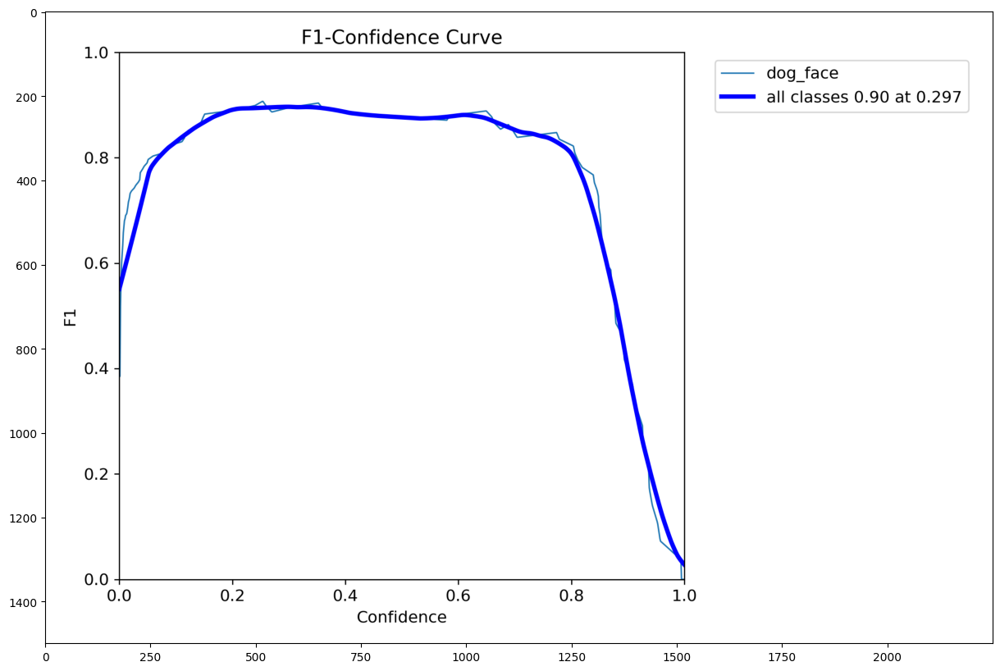

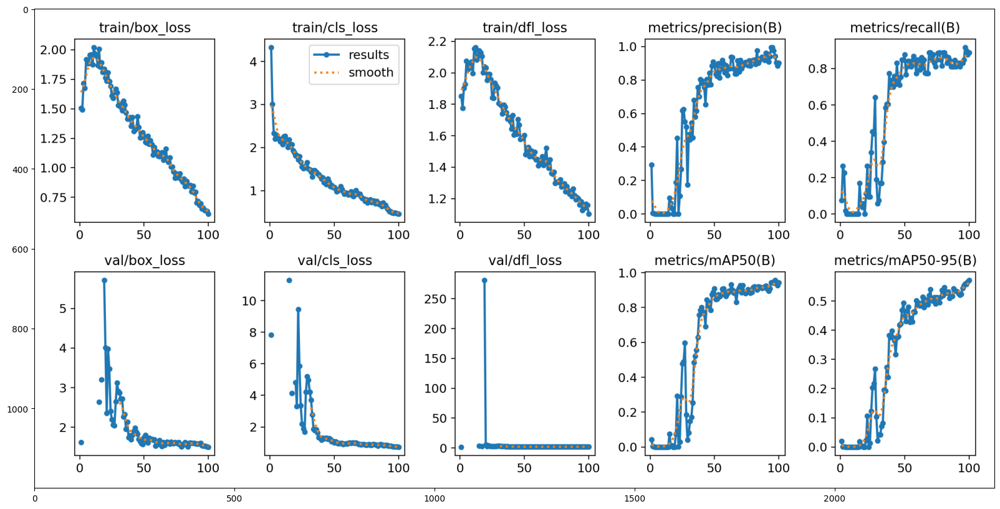

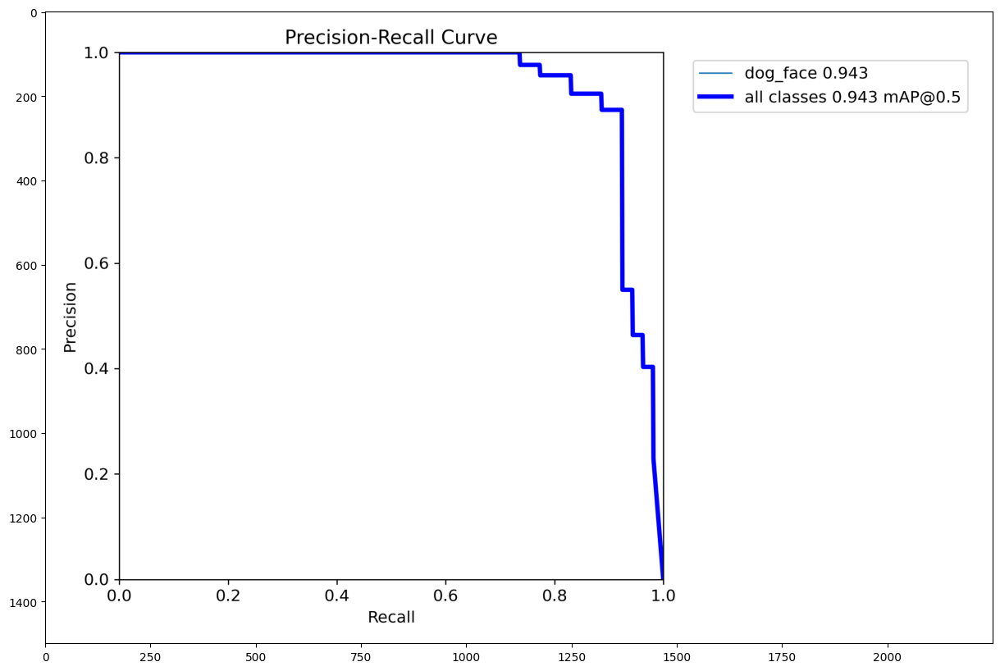

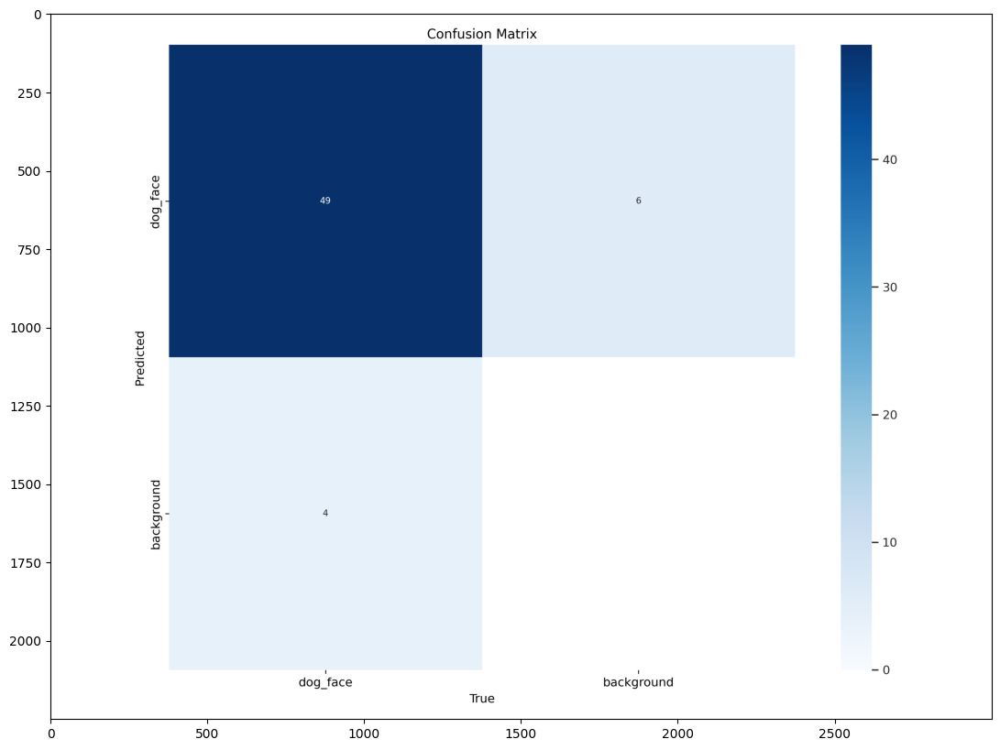

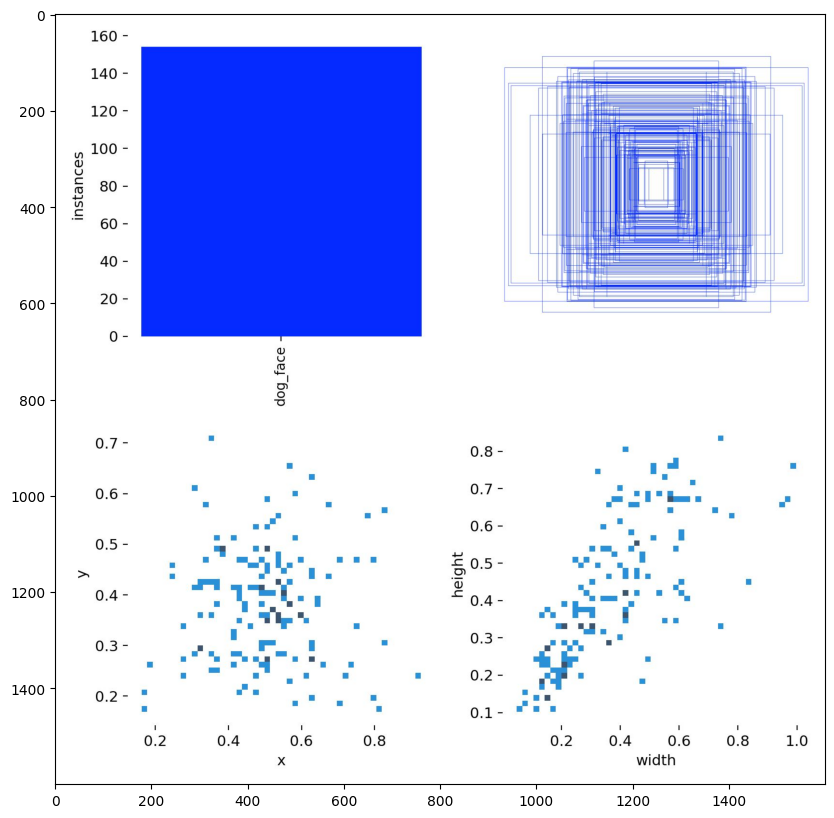

...

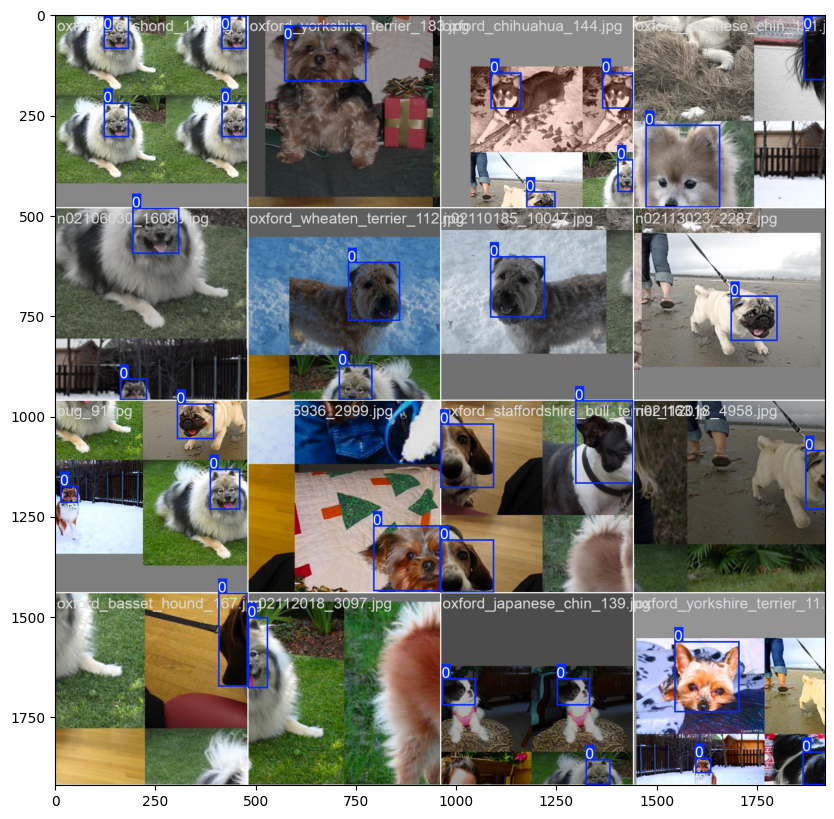

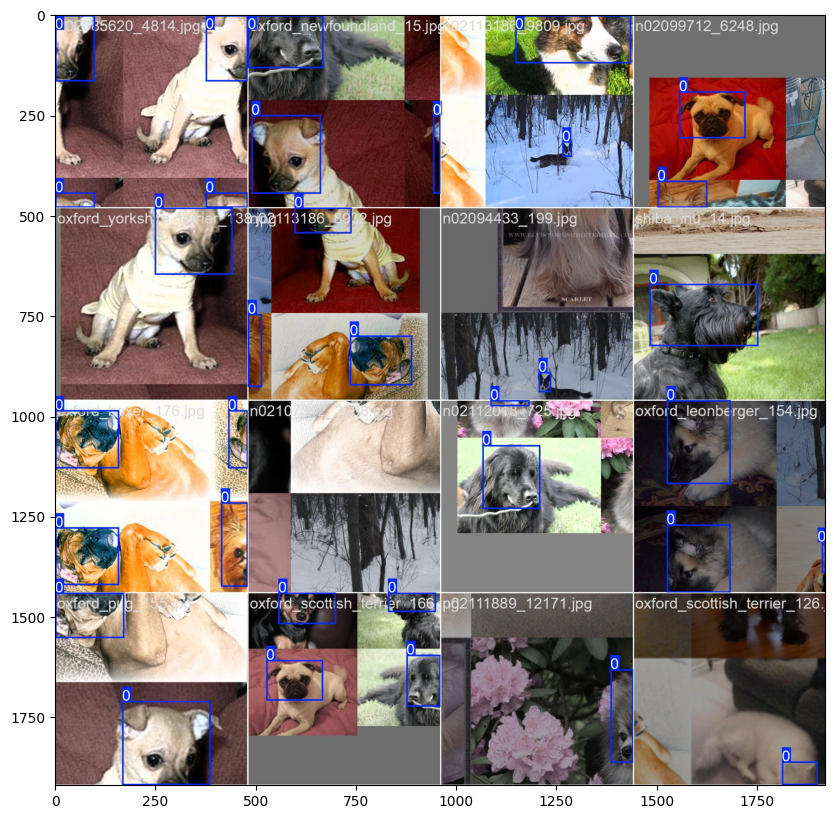

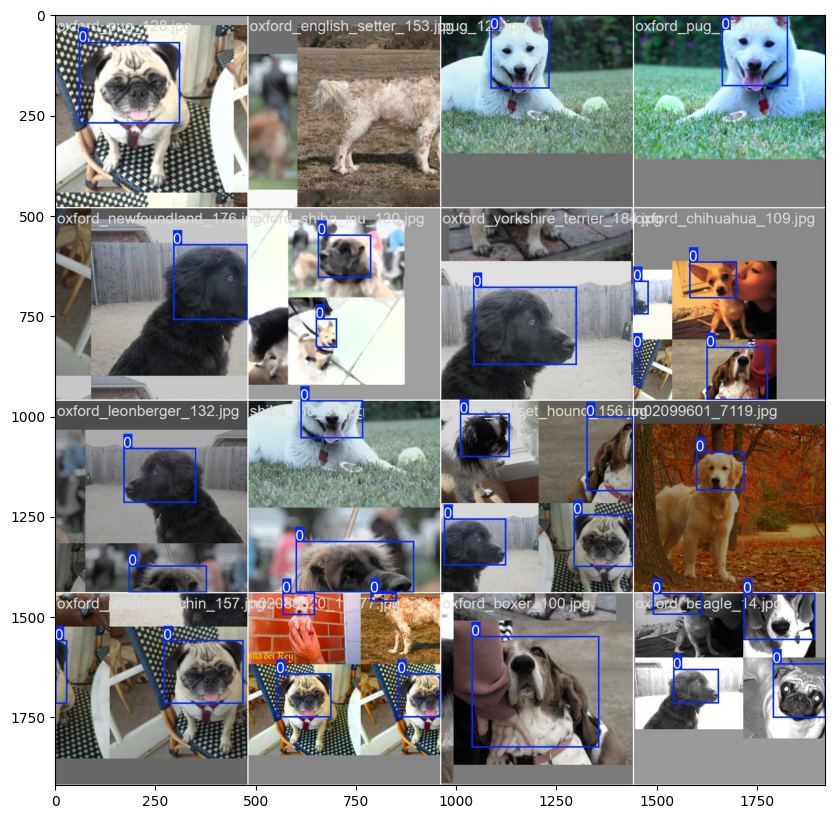

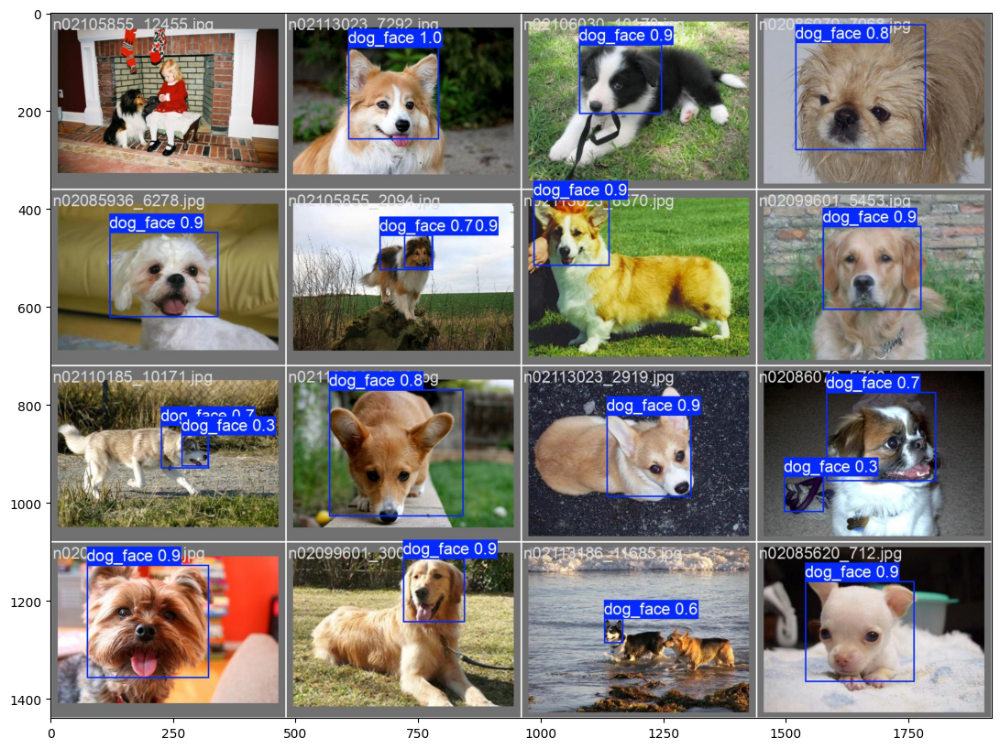

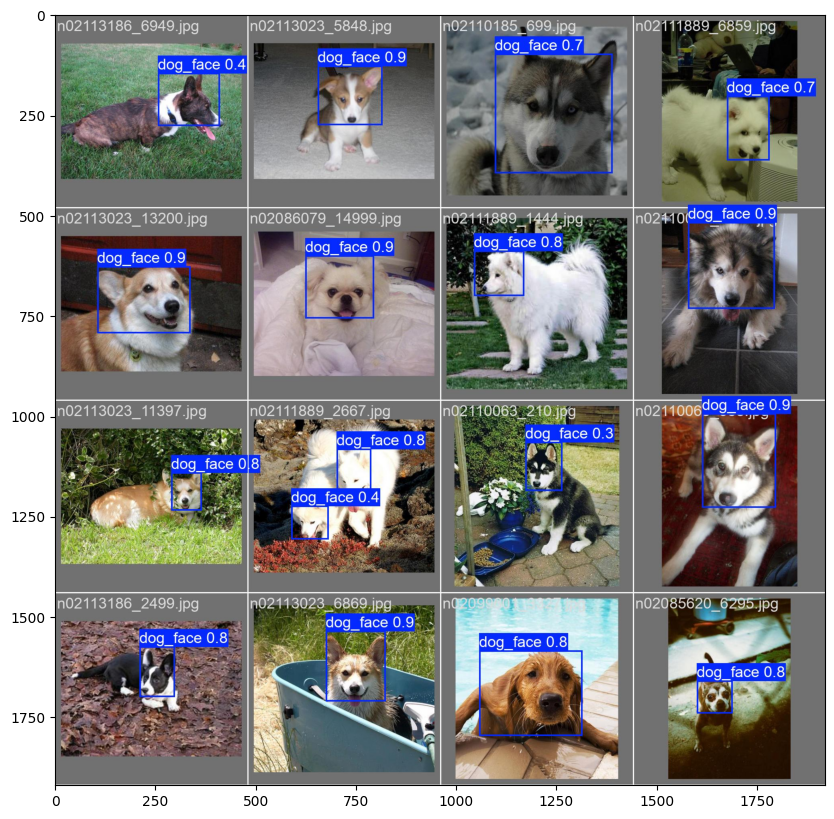

In [12]:
metrics_list = [
    "/kaggle/working/runs/detect/train/F1_curve.png",
    "/kaggle/working/runs/detect/train/results.png",
    "/kaggle/working/runs/detect/train/PR_curve.png",
    "/kaggle/working/runs/detect/train/confusion_matrix.png",
    "/kaggle/working/runs/detect/train/labels.jpg",
    "/kaggle/working/runs/detect/train/train_batch900.jpg",
    "/kaggle/working/runs/detect/train/train_batch0.jpg",
    "/kaggle/working/runs/detect/train/train_batch1.jpg",
    "/kaggle/working/runs/detect/train/train_batch2.jpg",
    "/kaggle/working/runs/detect/train/val_batch0_pred.jpg",
    "/kaggle/working/runs/detect/train/val_batch1_pred.jpg"
]

for i in metrics_list:
    img = Image.open(i)
    image=np.array(img)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show()